<a href="https://colab.research.google.com/github/elainejiangg/Brain-Tumor-Segmentation-UNet/blob/main/BrainTumorSegmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q segmentation-models-pytorch

import os
import time
from glob import glob
from tqdm import tqdm

import cv2
import numpy as np
import pandas as pd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import albumentations as A
from scipy.ndimage.morphology import binary_dilation
import segmentation_models_pytorch as smp
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split

import torch
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.5/109.5 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 28.8 MB/s eta 0:00:00


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
<ipython-input-1-22145fdabdf6>:14: DeprecationWarning: Please import `binary_dilation` from the `scipy.ndimage` namespace; the `scipy.ndimage.morphology` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.morphology import binary_dilation


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
#Download data
import kagglehub

# Download latest version
path = kagglehub.dataset_download("mateuszbuda/lgg-mri-segmentation")

print("Path to dataset files:", path)

100%|██████████| 714M/714M [00:12<00:00, 58.4MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2


In [ ]:
files_dir = path + '/kaggle_3m'
file_paths = glob(f'{files_dir}/*/*[0-9].tif')

In [ ]:
csv_path = os.path.join(path, "kaggle_3m/data.csv")
df = pd.read_csv(csv_path)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [ ]:
imputer = SimpleImputer(strategy="most_frequent")

df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,2.0,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,2.0,0.0
3,TCGA_CS_4944,2.0,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,2.0,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105,TCGA_HT_8563,2.0,5.0,3,1.0,2.0,2.0,2,1.0,2.0,1.0,3.0,2.0,1.0,30.0,3.0,2.0,0.0
106,TCGA_HT_A5RC,2.0,4.0,2,2.0,2.0,3.0,2,1.0,2.0,1.0,1.0,2.0,1.0,70.0,3.0,2.0,1.0
107,TCGA_HT_A616,2.0,5.0,2,1.0,2.0,2.0,1,1.0,1.0,1.0,1.0,2.0,1.0,36.0,3.0,2.0,0.0
108,TCGA_HT_A61A,2.0,5.0,2,1.0,2.0,2.0,1,3.0,1.0,1.0,1.0,6.0,1.0,20.0,3.0,2.0,0.0


In [ ]:
def get_file_row(path):
    """Produces ID of a patient, image and mask filenames from a particular path"""
    path_no_ext, ext = os.path.splitext(path)

    filename = os.path.basename(path)
    print(filename)

    patient_id = '_'.join(filename.split('_')[:3]) # Patient ID in the csv file consists of 3 first filename segments
    print(patient_id)
    return [patient_id, path, f'{path_no_ext}_mask{ext}']

In [ ]:
all_items = os.listdir(os.path.join(path, "kaggle_3m/TCGA_DU_7010_19860307"))

# Print the items
for item in all_items:
    print(item)

TCGA_DU_7010_19860307_7.tif
TCGA_DU_7010_19860307_43_mask.tif
TCGA_DU_7010_19860307_3.tif
TCGA_DU_7010_19860307_55.tif
TCGA_DU_7010_19860307_35_mask.tif
TCGA_DU_7010_19860307_16_mask.tif
TCGA_DU_7010_19860307_44_mask.tif
TCGA_DU_7010_19860307_38.tif
TCGA_DU_7010_19860307_51_mask.tif
TCGA_DU_7010_19860307_8_mask.tif
TCGA_DU_7010_19860307_13_mask.tif
TCGA_DU_7010_19860307_58.tif
TCGA_DU_7010_19860307_1.tif
TCGA_DU_7010_19860307_6.tif
TCGA_DU_7010_19860307_56.tif
TCGA_DU_7010_19860307_46.tif
TCGA_DU_7010_19860307_10.tif
TCGA_DU_7010_19860307_36_mask.tif
TCGA_DU_7010_19860307_43.tif
TCGA_DU_7010_19860307_14.tif
TCGA_DU_7010_19860307_42_mask.tif
TCGA_DU_7010_19860307_15_mask.tif
TCGA_DU_7010_19860307_36.tif
TCGA_DU_7010_19860307_34.tif
TCGA_DU_7010_19860307_53_mask.tif
TCGA_DU_7010_19860307_29_mask.tif
TCGA_DU_7010_19860307_12.tif
TCGA_DU_7010_19860307_54.tif
TCGA_DU_7010_19860307_40_mask.tif
TCGA_DU_7010_19860307_9.tif
TCGA_DU_7010_19860307_1_mask.tif
TCGA_DU_7010_19860307_18_mask.tif
TCGA

In [ ]:
# Show sample
get_file_row(os.path.join(path, "kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif"))

TCGA_DU_7010_19860307_45.tif
TCGA_DU_7010


['TCGA_DU_7010',
 '/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif',
 '/root/.cache/kagglehub/datasets/mateuszbuda/lgg-mri-segmentation/versions/2/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45_mask.tif']

In [ ]:
filenames_df = pd.DataFrame((get_file_row(filename) for filename in file_paths), columns=['Patient', 'image_filename', 'mask_filename'])
filenames_df

Streaming output truncated to the last 5000 lines.
TCGA_HT_7473_19970826_3.tif
TCGA_HT_7473
TCGA_HT_7473_19970826_26.tif
TCGA_HT_7473
TCGA_HT_7473_19970826_14.tif
TCGA_HT_7473
TCGA_HT_7473_19970826_21.tif
TCGA_HT_7473
TCGA_HT_7473_19970826_28.tif
TCGA_HT_7473
TCGA_CS_5395_19981004_12.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_7.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_18.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_5.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_2.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_1.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_19.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_16.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_14.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_11.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_8.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_9.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_15.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_17.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_10.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_6.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_13.tif
TCGA_CS_5395
TCGA_CS_5395_19981004_4.tif
TCGA_

,Patient,image_filename,mask_filename
0,TCGA_FG_7643,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
1,TCGA_FG_7643,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
2,TCGA_FG_7643,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3,TCGA_FG_7643,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
4,TCGA_FG_7643,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
...,...,...,...
3924,TCGA_FG_7634,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3925,TCGA_FG_7634,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3926,TCGA_FG_7634,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...
3927,TCGA_FG_7634,/root/.cache/kagglehub/datasets/mateuszbuda/lg...,/root/.cache/kagglehub/datasets/mateuszbuda/lg...


In [ ]:
class MriDataset(Dataset):
    def __init__(self, df, transform=None, mean=0.5, std=0.25):
        super(MriDataset, self).__init__()
        self.df = df
        self.transform = transform
        self.mean = mean
        self.std = std


    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx, raw=False):
        row = self.df.iloc[idx]
        img = cv2.imread(row['image_filename'], cv2.IMREAD_UNCHANGED)
        mask = cv2.imread(row['mask_filename'], cv2.IMREAD_GRAYSCALE)
        if raw:
            return img, mask

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        img = T.functional.to_tensor(img)
        mask = mask // 255
        mask = torch.Tensor(mask)
        return img, mask

In [ ]:
df = pd.merge(df, filenames_df, on="Patient")


In [ ]:
train_df, test_df = train_test_split(df, test_size=0.3)
test_df, valid_df = train_test_split(test_df, test_size=0.5)

In [ ]:
transform = A.Compose([
    A.ChannelDropout(p=0.3),
    A.RandomBrightnessContrast(p=0.3),
    A.ColorJitter(p=0.3),
])

train_dataset = MriDataset(train_df, transform)
valid_dataset = MriDataset(valid_df)
test_dataset = MriDataset(test_df)

In [ ]:
batch_size = 16

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1)

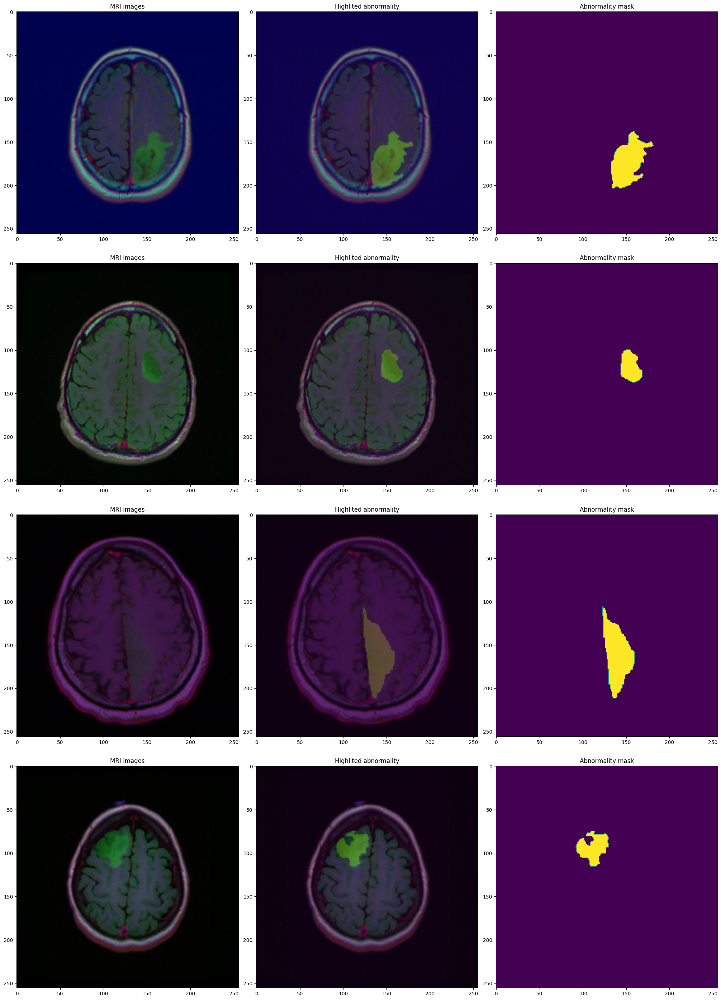

In [ ]:
%matplotlib inline
n_examples = 4

fig, axs = plt.subplots(n_examples, 3, figsize=(20, n_examples*7), constrained_layout=True)
i = 0
for ax in axs:
    while True:
        image, mask = train_dataset.__getitem__(i, raw=True)
        i += 1
        if np.any(mask):
            ax[0].set_title("MRI images")
            ax[0].imshow(image)
            ax[1].set_title("Highlited abnormality")
            ax[1].imshow(image)
            ax[1].imshow(mask, alpha=0.2)
            ax[2].imshow(mask)
            ax[2].set_title("Abnormality mask")
            break


In [ ]:
class EarlyStopping():
    """
    Stops training when loss stops decreasing in a PyTorch module.
    """
    def __init__(self, patience:int = 6, min_delta: float = 0, weights_path: str = 'weights.pt'):
        """
        :param patience: number of epochs of non-decreasing loss before stopping
        :param min_delta: minimum difference between best and new loss that is considered
            an improvement
        :paran weights_path: Path to the file that should store the model's weights
        """
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.weights_path = weights_path

    def __call__(self, val_loss: float, model: torch.nn.Module):
        if self.best_loss - val_loss > self.min_delta:
            self.best_loss = val_loss
            torch.save(model.state_dict(), self.weights_path)
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

    def load_weights(self, model: torch.nn.Module):
        """
        Loads weights of the best model.
        :param model: model to which the weigths should be loaded
        """
        return model.load_state_dict(torch.load(self.weights_path))

In [ ]:
def iou_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Intersection over Union for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    union = (predictions | labels).float().sum((1, 2))

    iou = (intersection + e) / (union + e)
    return iou

def dice_pytorch(predictions: torch.Tensor, labels: torch.Tensor, e: float = 1e-7):
    """Calculates Dice coefficient for a tensor of predictions"""
    predictions = torch.where(predictions > 0.5, 1, 0)
    labels = labels.byte()

    intersection = (predictions & labels).float().sum((1, 2))
    return ((2 * intersection) + e) / (predictions.float().sum((1, 2)) + labels.float().sum((1, 2)) + e)

In [ ]:
def BCE_dice(output, target, alpha=0.01):
    bce = torch.nn.functional.binary_cross_entropy(output, target)
    soft_dice = 1 - dice_pytorch(output, target).mean()
    return bce + alpha * soft_dice

In [ ]:
model = smp.Unet(
    encoder_name="efficientnet-b7",
    encoder_weights="imagenet",
    in_channels=3,
    classes=1,
    activation='sigmoid',
)
model.to(device);

Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b7-dcc49843.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b7-dcc49843.pth
100%|██████████| 254M/254M [00:02<00:00, 112MB/s]


In [ ]:
def training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler):
    history = {'train_loss': [], 'val_loss': [], 'val_IoU': [], 'val_dice': []}
    early_stopping = EarlyStopping(patience=7)

    for epoch in range(1, epochs + 1):
        start_time = time.time()

        running_loss = 0
        model.train()
        for i, data in enumerate(tqdm(train_loader)):
            img, mask = data
            img, mask = img.to(device), mask.to(device)
            predictions = model(img)
            predictions = predictions.squeeze(1)
            loss = loss_fn(predictions, mask)
            running_loss += loss.item() * img.size(0)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        model.eval()
        with torch.no_grad():
            running_IoU = 0
            running_dice = 0
            running_valid_loss = 0
            for i, data in enumerate(valid_loader):
                img, mask = data
                img, mask = img.to(device), mask.to(device)
                predictions = model(img)
                predictions = predictions.squeeze(1)
                running_dice += dice_pytorch(predictions, mask).sum().item()
                running_IoU += iou_pytorch(predictions, mask).sum().item()
                loss = loss_fn(predictions, mask)
                running_valid_loss += loss.item() * img.size(0)
        train_loss = running_loss / len(train_loader.dataset)
        val_loss = running_valid_loss / len(valid_loader.dataset)
        val_dice = running_dice / len(valid_loader.dataset)
        val_IoU = running_IoU / len(valid_loader.dataset)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_IoU'].append(val_IoU)
        history['val_dice'].append(val_dice)
        print(f'Epoch: {epoch}/{epochs} | Training loss: {train_loss} | Validation loss: {val_loss} | Validation Mean IoU: {val_IoU} '
         f'| Validation Dice coefficient: {val_dice}')

        lr_scheduler.step(val_loss)
        if early_stopping(val_loss, model):
            early_stopping.load_weights(model)
            break
    model.eval()
    return history

In [ ]:
loss_fn = BCE_dice
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 60
lr_scheduler = ReduceLROnPlateau(optimizer=optimizer, patience=2,factor=0.2)

history = training_loop(epochs, model, train_loader, valid_loader, optimizer, loss_fn, lr_scheduler)

100%|██████████| 172/172 [03:00<00:00,  1.05s/it]


Epoch: 1/60 | Training loss: 0.10776661513136192 | Validation loss: 0.16473049597214845 | Validation Mean IoU: 0.15942772056086588 | Validation Dice coefficient: 0.18101853394912462


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 2/60 | Training loss: 0.01323781156539917 | Validation loss: 0.012503208864038273 | Validation Mean IoU: 0.8214224071825965 | Validation Dice coefficient: 0.8548408007217666


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 3/60 | Training loss: 0.008966663467613134 | Validation loss: 0.00795295030446881 | Validation Mean IoU: 0.8838657249838618 | Validation Dice coefficient: 0.9143659640166719


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 4/60 | Training loss: 0.007306428036398509 | Validation loss: 0.007615777644944393 | Validation Mean IoU: 0.8929309747986874 | Validation Dice coefficient: 0.9220853983345678


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 5/60 | Training loss: 0.005667110076851466 | Validation loss: 0.006484786126667918 | Validation Mean IoU: 0.8994990187176203 | Validation Dice coefficient: 0.9282579050225727


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 6/60 | Training loss: 0.004904181193560362 | Validation loss: 0.007819715705779145 | Validation Mean IoU: 0.8779969377032781 | Validation Dice coefficient: 0.9070385512659105


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 7/60 | Training loss: 0.00510391967963766 | Validation loss: 0.008291845844458726 | Validation Mean IoU: 0.8469177165273892 | Validation Dice coefficient: 0.8759095078807766


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 8/60 | Training loss: 0.004957928927784616 | Validation loss: 0.012568561499149112 | Validation Mean IoU: 0.8137166766797082 | Validation Dice coefficient: 0.8436375230045642


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 9/60 | Training loss: 0.0038082647641951386 | Validation loss: 0.005935795213711464 | Validation Mean IoU: 0.8976196159750728 | Validation Dice coefficient: 0.9250712879633499


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 10/60 | Training loss: 0.003409135654568672 | Validation loss: 0.005725709020586337 | Validation Mean IoU: 0.9076411974632134 | Validation Dice coefficient: 0.9347126491999223


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 11/60 | Training loss: 0.003242668044160713 | Validation loss: 0.005665319509235984 | Validation Mean IoU: 0.9074366795814643 | Validation Dice coefficient: 0.9348029395281259


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 12/60 | Training loss: 0.003106731310148131 | Validation loss: 0.00577395277066251 | Validation Mean IoU: 0.9086434024875447 | Validation Dice coefficient: 0.935981483782752


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 13/60 | Training loss: 0.0029852040222930636 | Validation loss: 0.005793878659448129 | Validation Mean IoU: 0.9077762296644308 | Validation Dice coefficient: 0.9353877019074004


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 14/60 | Training loss: 0.0029387474822049793 | Validation loss: 0.005891685745031652 | Validation Mean IoU: 0.9058538889480849 | Validation Dice coefficient: 0.9332547996003749


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 15/60 | Training loss: 0.002761325021189722 | Validation loss: 0.005883212344941951 | Validation Mean IoU: 0.9032501269195039 | Validation Dice coefficient: 0.9308887966608597


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 16/60 | Training loss: 0.0027378616634417662 | Validation loss: 0.00593792232921568 | Validation Mean IoU: 0.9060956857972225 | Validation Dice coefficient: 0.9335686780638613


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 17/60 | Training loss: 0.0027259049625559285 | Validation loss: 0.005956653173681411 | Validation Mean IoU: 0.905978763709634 | Validation Dice coefficient: 0.9335959256705592


100%|██████████| 172/172 [02:59<00:00,  1.04s/it]


Epoch: 18/60 | Training loss: 0.0026726702331480653 | Validation loss: 0.005933825733234822 | Validation Mean IoU: 0.9059158309031341 | Validation Dice coefficient: 0.9334578433279264


<ipython-input-17-e79646ffd485>:34: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return model.load_state_dict(torch.load(self.weights_path))


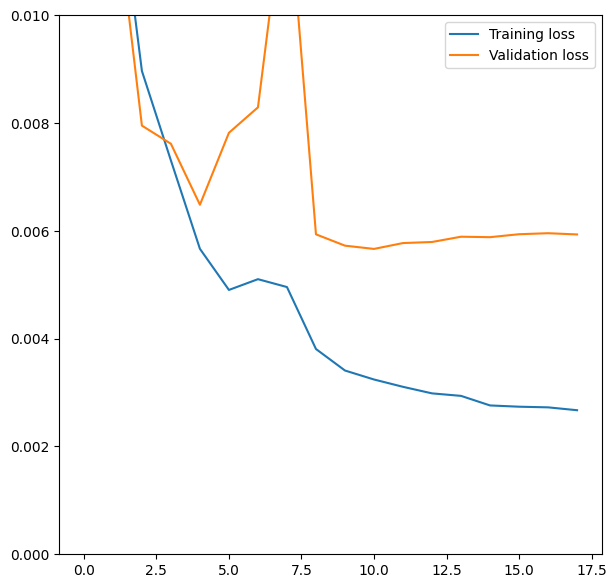

In [ ]:
#Training Evaluation
plt.figure(figsize=(7, 7))
plt.plot(history['train_loss'], label='Training loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.ylim(0, 0.01)
plt.legend()
plt.show()

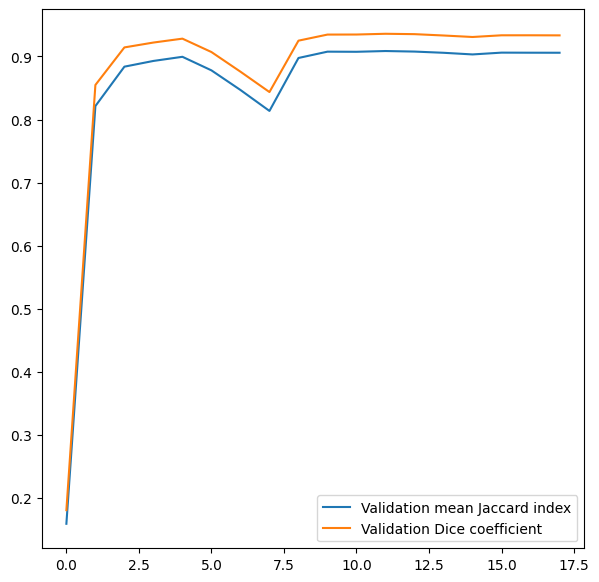

In [ ]:
plt.figure(figsize=(7, 7))
plt.plot(history['val_IoU'], label='Validation mean Jaccard index')
plt.plot(history['val_dice'], label='Validation Dice coefficient')
plt.legend()
plt.show()

In [ ]:
with torch.no_grad():
    running_IoU = 0
    running_dice = 0
    running_loss = 0
    for i, data in enumerate(test_loader):
        img, mask = data
        img, mask = img.to(device), mask.to(device)
        predictions = model(img)
        predictions = predictions.squeeze(1)
        running_dice += dice_pytorch(predictions, mask).sum().item()
        running_IoU += iou_pytorch(predictions, mask).sum().item()
        loss = loss_fn(predictions, mask)
        running_loss += loss.item() * img.size(0)
    loss = running_loss / len(test_dataset)
    dice = running_dice / len(test_dataset)
    IoU = running_IoU / len(test_dataset)

    print(f'Tests: loss: {loss} | Mean IoU: {IoU} | Dice coefficient: {dice}')

Tests: loss: 0.005312255086640729 | Mean IoU: 0.8968498038726124 | Dice coefficient: 0.9248513558048201


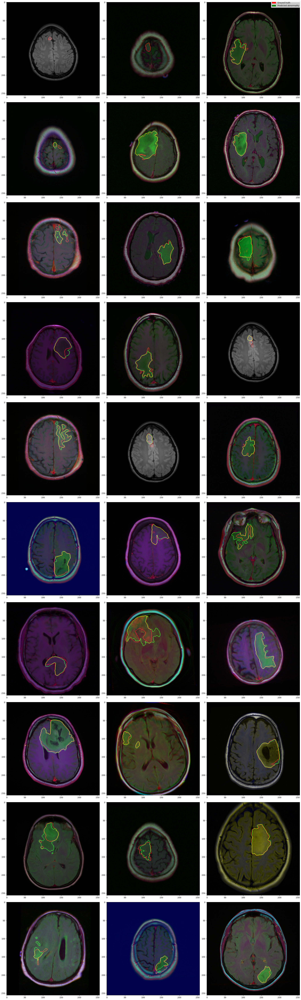

In [ ]:
#Testing
%matplotlib inline

width = 3
columns = 10
n_examples = columns * width

fig, axs = plt.subplots(columns, width, figsize=(7*width , 7*columns), constrained_layout=True)
red_patch = mpatches.Patch(color='red', label='The red data')
fig.legend(loc='upper right',handles=[
    mpatches.Patch(color='red', label='Ground truth'),
    mpatches.Patch(color='green', label='Predicted abnormality')])
i = 0
with torch.no_grad():
    for data in test_loader:
        image, mask = data
        mask = mask[0]
        if not mask.byte().any():
            continue
        image = image.to(device)
        prediction = model(image).to('cpu')[0][0]
        prediction = torch.where(prediction > 0.5, 1, 0)
        prediction_edges = prediction - binary_dilation(prediction)
        ground_truth = mask - binary_dilation(mask)
        image[0, 0, ground_truth.bool()] = 1
        image[0, 1, prediction_edges.bool()] = 1

        axs[i//width][i%width].imshow(image[0].to('cpu').permute(1, 2, 0))
        if n_examples == i + 1:
            break
        i += 1